<a href="https://colab.research.google.com/github/hkbu-kennycheng/comp3925/blob/main/lab5_feature_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab5 feature engineering

# More examples on advanced web data collection with pyppeteer

In [ ]:
!apt update
!apt install chromium-browser chromium-chromedriver fonts-noto fonts-noto-cjk
!pip install pyppeteer nest_asyncio pandas numpy tqdm seaborn
# for local runtime with anaconda, please comment out above code and use following conda install intead
# !conda install pyppeteer nest_asyncio pandas numpy tqdm seaborn

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:10 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:11 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [917 kB]
Hit:13 http://ppa.lau

In [ ]:
import asyncio
import nest_asyncio
from pyppeteer import launch

nest_asyncio.apply()

Let's have another example on https://www.fortress.com.hk/en/search?q=samsung

In [ ]:
async def main():
  browser = await launch({'executablePath':'/usr/bin/chromium-browser', 'headless': True, 'args':['--no-sandbox']})
  page = await browser.newPage() # open a new browser window
  await page.setUserAgent('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/97.0.4692.71 Safari/537.36')
  await page.setViewport({'width':1280, 'height':1024})
  await page.goto('https://www.fortress.com.hk/en/search?q=samsung', {'waitUntil':'networkidle0'}) # goto the url
  await page.screenshot({'path': 'example.png', 'fullPage':True}) # save screenshot as example.png
  await browser.close() # close browser window

As unual, we declare a helper function for short the code of running a async function.

In [ ]:
def run(func):
  return asyncio.get_event_loop().run_until_complete(func)

In [ ]:
run(main())

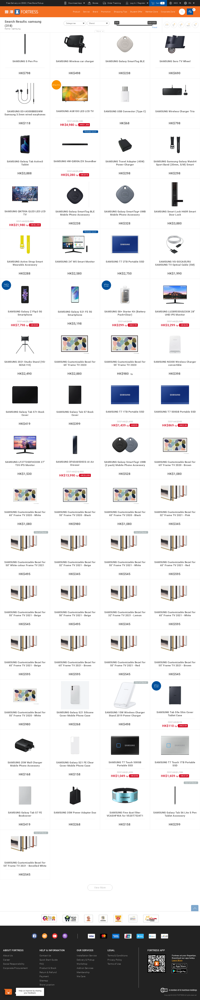

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
cv2_imshow(cv2.imread('example.png'))

In [ ]:
def runAndReturn(func):
  return asyncio.get_event_loop().run_until_complete(asyncio.gather(func))[0]

## Controll Chrome to click on an element

Let's use `page.J` to found the `View More` button and click on it until it got a style attribute.

In [ ]:
async def tryFortressHK(keyword):
  browser = await launch({'executablePath':'/usr/bin/chromium-browser', 'headless': True, 'args':['--no-sandbox']})
  page = await browser.newPage() # open a new browser window
  await page.setUserAgent('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/97.0.4692.71 Safari/537.36')
  await page.setViewport({'width':1280, 'height':1024})
  await page.goto(f'https://www.fortress.com.hk/en/search?q={keyword}', {'waitUntil':'networkidle0'}) # goto the urldow
  viewMore = await page.J('.btn-ajax-add-products')
  if viewMore == None:
    return
  while True:
    viewMoreWithStyleAttr = await page.J('.btn-ajax-add-products[style]')
    if not viewMoreWithStyleAttr == None:
      break
    await viewMore.click()
    await page.waitForNavigation({'waitUntil':'networkidle0'})
  await page.screenshot({'path': f'{keyword}.png', 'fullPage':True}) # save screenshot
  await browser.close() # close browser window

In [ ]:
run(tryFortressHK('samsung'))

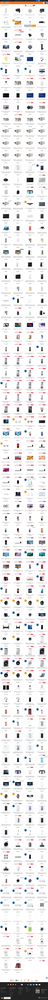

In [ ]:
cv2_imshow(cv2.imread('samsung.png'))

## Collect data in attribute

In [ ]:
async def searchFortressHK(keyword):
  data = []
  browser = await launch({'executablePath':'/usr/bin/chromium-browser', 'headless': True, 'args':['--no-sandbox']})
  page = await browser.newPage() # open a new browser window
  await page.setUserAgent('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/97.0.4692.71 Safari/537.36')
  await page.setViewport({'width':1280, 'height':1024})
  await page.goto(f'https://www.fortress.com.hk/en/search?q={keyword}', {'waitUntil':'networkidle0'}) # goto the urldow
  viewMore = await page.J('.btn-ajax-add-products')
  if viewMore == None:
    return data
  while True:
    viewMoreWithStyleAttr = await page.J('.btn-ajax-add-products[style]')
    if not viewMoreWithStyleAttr == None:
      break
    await viewMore.click()
    await page.waitForNavigation({'waitUntil':'networkidle0'})

  data = [{
    'title': await p.Jeval('.thumb', 'node => node.getAttribute("title")'),
    'name': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-name")'),
    'brand': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-brand")'),
    'category': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-category")'),
    'price': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-price")'),
    'variantname': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-variantname")'),
    'imageurl': await p.Jeval('.thumb img', 'node => "https://www.fortress.com.hk" + node.getAttribute("src")')
  } for p in await page.JJ('.products .grid-item')]

  await browser.close() # close browser window
  return data

Running code with `%time` would tell us the total execution time.

In [ ]:
%time samsung = runAndReturn(searchFortressHK('samsung'))

CPU times: user 7.15 s, sys: 698 ms, total: 7.84 s
Wall time: 25.9 s


In [ ]:
samsung

[{'brand': 'samsung',
  'category': 'mobile-and-communications/mobile-phone-accessories',
  'imageurl': 'https://www.fortress.com.hk/medias/12481593-12481593.jpg?context=bWFzdGVyfGZyb250cHJkdGh1bWJ8NDA2OXxpbWFnZS9qcGVnfGZyb250cHJkdGh1bWIvaGNhL2hkZC85ODIyNjEzNDM4NDk0LmpwZ3xmYWZmZjI3NzI4YjEwYmNjNmRiY2VkNWIxYTdkYTI0ZWZlODNhNzEyMThiYTg4Y2NmNGJjYTVmZTA4NWNjNzEx',
  'name': 's-pen-pro',
  'price': '798.0',
  'title': 'SAMSUNG S Pen Pro',
  'variantname': 'samsung-s-pen-pro'},
 {'brand': 'samsung',
  'category': 'mobile-and-communications/chargers-and-adapters-and-cables',
  'imageurl': 'https://www.fortress.com.hk/medias/12593309-12593309.jpg?context=bWFzdGVyfGZyb250cHJkdGh1bWJ8MTI2MzF8aW1hZ2UvanBlZ3xmcm9udHByZHRodW1iL2g4OS9oODcvOTkyMDM5NDg4NzE5OC5qcGd8YTFkOGFjOTQ4NjIyYTk1ZTZlYTViYmM5Y2QzOTY2N2Y4MmRlMThiMDUwZDcyNTdiODc0Y2ZiMzQyZGQ5Nzk3OA',
  'name': 'wireless-car-charger',
  'price': '498.0',
  'title': 'SAMSUNG Wireless car charger',
  'variantname': 'samsung-wireless-car'},
 {'brand': 'sam

It take around 20 second for 318 product, let's try with 5729 products.

In [ ]:
%time zero = runAndReturn(searchFortressHK('0'))

CPU times: user 48.3 s, sys: 6.06 s, total: 54.4 s
Wall time: 8min 5s


Thus, we could except if we loop through `0-9` and `a-z`, it may takes 288 minutes which is more than 4 hours.

## Execrise: Collect data from https://www.abouthai.com/ and https://www.broadwaylifestyle.com/hk_en/

Please download product data and transform it into pandas DataFrame as `abouthaidf`. At least you would have `name` and `price` columns in the DataFrame. You may collect as much data as possibe.

## Go further to collect product description

In [ ]:
async def searchFortressHKDesc(keyword):
  data = []
  browser = await launch({'executablePath':'/usr/bin/chromium-browser', 'headless': True, 'args':['--no-sandbox']})
  page = await browser.newPage() # open a new browser window
  await page.setUserAgent('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/97.0.4692.71 Safari/537.36')
  await page.setViewport({'width':1280, 'height':1024})
  await page.goto(f'https://www.fortress.com.hk/en/search?q={keyword}', {'waitUntil':'networkidle0'}) # goto the urldow
  viewMore = await page.J('.btn-ajax-add-products')
  if viewMore == None:
    return data
  while True:
    viewMoreWithStyleAttr = await page.J('.btn-ajax-add-products[style]')
    if not viewMoreWithStyleAttr == None:
      break
    await viewMore.click()
    await page.waitForNavigation({'waitUntil':'networkidle0'})

  for p in await page.JJ('.products .grid-item'):
    item = {
      'title': await p.Jeval('.thumb', 'node => node.getAttribute("title")'),
      'name': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-name")'),
      'brand': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-brand")'),
      'category': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-category")'),
      'price': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-price")'),
      'variantname': await p.Jeval('.thumb', 'node => node.getAttribute("data-gtm-product-impressions-variantname")'),
      'imageurl': await p.Jeval('.thumb img', 'node => "https://www.fortress.com.hk" + node.getAttribute("src")')
    }
    try: # wrapping in try-except block handle any throwing error
      await p.Jeval('.btn-view', 'node => node.click()')
      overlay = await page.waitForSelector('.quickview.overlay', {'visible':True, 'timeout':3000}) # wait for element to be visible with class name quickview and overlay
      await overlay.screenshot({'path': 'overlay.png'}) # save screenshot of the overlay
      item['desc'] = await overlay.Jeval('.descriptionAfterPromotionPopup', 'node => node.textContent')
      await overlay.Jeval('.btn-close', 'node => node.click()')
      await page.waitForSelector('.quickview.overlay', {'hidden':True, 'timeout':3000})
    except:
      pass
    data.append(item)

  await browser.close() # close browser window
  return data

This time take much longer time to execute.

In [ ]:
%time samsung = runAndReturn(searchFortressHKDesc('samsung'))

CPU times: user 36.7 s, sys: 2.76 s, total: 39.5 s
Wall time: 10min 21s


In [ ]:
samsung

[{'brand': 'samsung',
  'category': 'mobile-and-communications/mobile-phone-accessories',
  'desc': 'SAMSUNG S Pen Pro',
  'imageurl': 'https://www.fortress.com.hk/medias/12481593-12481593.jpg?context=bWFzdGVyfGZyb250cHJkdGh1bWJ8NDA2OXxpbWFnZS9qcGVnfGZyb250cHJkdGh1bWIvaGNhL2hkZC85ODIyNjEzNDM4NDk0LmpwZ3xmYWZmZjI3NzI4YjEwYmNjNmRiY2VkNWIxYTdkYTI0ZWZlODNhNzEyMThiYTg4Y2NmNGJjYTVmZTA4NWNjNzEx',
  'name': 's-pen-pro',
  'price': '798.0',
  'title': 'SAMSUNG S Pen Pro',
  'variantname': 'samsung-s-pen-pro'},
 {'brand': 'samsung',
  'category': 'mobile-and-communications/chargers-and-adapters-and-cables',
  'desc': 'Samsung Wireless car charger',
  'imageurl': 'https://www.fortress.com.hk/medias/12593309-12593309.jpg?context=bWFzdGVyfGZyb250cHJkdGh1bWJ8MTI2MzF8aW1hZ2UvanBlZ3xmcm9udHByZHRodW1iL2g4OS9oODcvOTkyMDM5NDg4NzE5OC5qcGd8YTFkOGFjOTQ4NjIyYTk1ZTZlYTViYmM5Y2QzOTY2N2Y4MmRlMThiMDUwZDcyNTdiODc0Y2ZiMzQyZGQ5Nzk3OA',
  'name': 'wireless-car-charger',
  'price': '498.0',
  'title': 'SAMSUNG Wireles

# Data explore and cleaning

In [ ]:
import pandas as pd
import numpy as np

In [202]:
# !wget https://gist.githubusercontent.com/hkbu-kennycheng/a34000d0034a9e4e6bba86a4000e08b2/raw/2b900b8a93b312d022637fc164ab313d696e396d/samsung.csv
#samsungdf = pd.read_csv('samsung.csv')
samsungdf = pd.DataFrame(samsung)
samsungdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318 entries, 0 to 317
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   318 non-null    int64  
 1   title        318 non-null    object 
 2   name         318 non-null    object 
 3   brand        318 non-null    object 
 4   category     318 non-null    object 
 5   price        318 non-null    float64
 6   variantname  318 non-null    object 
 7   imageurl     318 non-null    object 
 8   desc         297 non-null    object 
dtypes: float64(1), int64(1), object(7)
memory usage: 22.5+ KB


In [203]:
samsungdf

,Unnamed: 0,title,name,brand,category,price,variantname,imageurl,desc
0,0,SAMSUNG S Pen Pro,s-pen-pro,samsung,mobile-and-communications/mobile-phone-accesso...,798.0,samsung-s-pen-pro,https://www.fortress.com.hk/medias/12481593-12...,SAMSUNG S Pen Pro
1,1,SAMSUNG Wireless car charger,wireless-car-charger,samsung,mobile-and-communications/chargers-and-adapter...,498.0,samsung-wireless-car,https://www.fortress.com.hk/medias/12593309-12...,Samsung Wireless car charger
2,2,SAMSUNG Galaxy SmartTag BLE,galaxy-smarttag-ble,samsung,mobile-and-communications/mobile-phone-accesso...,238.0,samsung-galaxy-smart,https://www.fortress.com.hk/medias/Samsung-Gal...,Samsung Galaxy SmartTag BLE
3,3,SAMSUNG Sero TV Wheel,sero-tv-wheel,samsung,tv-entertainment/tv-entertainment-accessories,690.0,samsung-tv-accessory,https://www.fortress.com.hk/medias/Samsung-TV-...,Sero TV Wheel
4,4,SAMSUNG EO-IA500BBEGWW Samsung 3.5mm wired ear...,eo-ia500bbegww-samsung-35mm-wired-earphones,samsung,tv-entertainment/earphones-and-headphones,118.0,samsung-35mm-wired-,https://www.fortress.com.hk/medias/12582520-12...,Samsung 3.5mm wired earphones
...,...,...,...,...,...,...,...,...,...
313,313,SIDO Samsung Tab S7 FE Fiber Glass Screen Prot...,samsung-tab-s7-fe-fiber-glass-screen-protector,sido,computing/cases-and-screen-protectors,99.0,12369091,https://www.fortress.com.hk/medias/12369091-12...,For Samsung Tab S7 FE Fiber Glass Screen Prote...
314,314,Bose QuietComfort® 20 Acoustic Noise Cancellin...,quietcomfort®-20-acoustic-noise-cancelling®-he...,bose,tv-entertainment/earphones-and-headphones,2098.0,quietcomfort®-20-aco,https://www.fortress.com.hk/medias/12340635-12...,In-ear. Noise cancelling. Better sound.
315,315,SIDO Samsung Tab A8 10.5” Fiber Glass Screen P...,samsung-tab-a8-105”-fiber-glass-screen-protector,sido,computing/cases-and-screen-protectors,99.0,12585472,https://www.fortress.com.hk/medias/12585472-12...,For Samsung Galaxy Tab A8 10.5” Fiber Glass Sc...
316,316,SIDO Samsung Tab A7 10.4,samsung-tab-a7-104-fiber-glass-screen-protector,sido,computing/cases-and-screen-protectors,49.0,sido-samsung-tab-a7,https://www.fortress.com.hk/medias/SIDO-Samsun...,"For Samsung Tab A7 10.4"" (T500/T505) Fiber Gla..."


In [ ]:
samsungdf.to_csv('samsung.csv')

## Dropping duplicated data

In [204]:
samsungdf.duplicated(keep=False).describe()

count       318
unique        1
top       False
freq        318
dtype: object

Drop them with `drop_duplicates`

In [205]:
samsungdf.drop_duplicates(inplace=True)

No more duplicates now

In [206]:
samsungdf.duplicated(keep=False).describe()

count       318
unique        1
top       False
freq        318
dtype: object

### name

In [207]:
samsungdf['name'] = samsungdf['name'].str.replace('-', ' ')
samsungdf['name'].head()

0                                      s pen pro
1                           wireless car charger
2                            galaxy smarttag ble
3                                  sero tv wheel
4    eo ia500bbegww samsung 35mm wired earphones
Name: name, dtype: object

In [211]:
samsungdf['name'] = samsungdf['name'].astype(str)
samsungdf['name'].describe()

count                                            318
unique                                           299
top       galaxy s21 leather cover mobile phone case
freq                                               2
Name: name, dtype: object

In [210]:
samsungdf[samsungdf['name'].duplicated(False)].sort_values('name')

,Unnamed: 0,title,name,brand,category,price,variantname,imageurl,desc
189,189,SAMSUNG Galaxy Book Pro 360 Notebook,galaxy book pro 360 notebook,samsung,computing/laptops,11980.0,galaxy-book-pro-360-,https://www.fortress.com.hk/medias/12326489-12...,"NP930QDB-KF2HK, Thin, light, yet reliable. It'..."
188,188,SAMSUNG Galaxy Book Pro 360 Notebook,galaxy book pro 360 notebook,samsung,computing/laptops,11980.0,12463336,https://www.fortress.com.hk/medias/12463336-12...,"NP930QDB-KD1HK, Thin, light, yet reliable. It'..."
161,161,SAMSUNG Galaxy Book Pro Notebook,galaxy book pro notebook,samsung,computing/laptops,10280.0,galaxy-book-pro-13,https://www.fortress.com.hk/medias/Galaxy-Book...,"NP930XDB-KE2HK, The thinnest Galaxy Book with ..."
160,160,SAMSUNG Galaxy Book Pro Notebook,galaxy book pro notebook,samsung,computing/laptops,8780.0,galaxy-book-pro-13,https://www.fortress.com.hk/medias/12326462-12...,"NP930XDB-KG1HK, The thinnest Galaxy Book with ..."
175,175,SAMSUNG Galaxy S21 5G Smartphone,galaxy s21 5g smartphone,samsung,mobile-and-communications/smartphones,5398.0,12250111,https://www.fortress.com.hk/medias/12250111-12...,Director’s View: shoots from multiple angles s...
169,169,SAMSUNG Galaxy S21+ 5G Smartphone,galaxy s21 5g smartphone,samsung,mobile-and-communications/smartphones,7098.0,galaxy-s21-5g-8gb2,https://www.fortress.com.hk/medias/12250074-12...,Director’s View: shoots from multiple angles s...
271,271,SAMSUNG Galaxy S21 Clear View Cover Mobile Pho...,galaxy s21 clear view cover mobile phone case,samsung,mobile-and-communications/phone-cases-and-scre...,388.0,12246649,https://www.fortress.com.hk/medias/Galaxy-S21-...,"Antimicrobial coating, See-Through Concept, Cl..."
270,270,SAMSUNG Galaxy S21+ Clear View Cover Mobile Ph...,galaxy s21 clear view cover mobile phone case,samsung,mobile-and-communications/phone-cases-and-scre...,388.0,galaxy-s21-clear-vi,https://www.fortress.com.hk/medias/Galaxy-S21-...,"Antimicrobial coating, See-Through Concept, Cl..."
20,20,SAMSUNG Galaxy S21 FE 5G Smartphone,galaxy s21 fe 5g smartphone,samsung,mobile-and-communications/smartphones,5198.0,12585616,https://www.fortress.com.hk/medias/12585616-12...,6.4” FHD+ 120Hz Infinity-O Dynamic AMOLED 2X D...
111,111,SAMSUNG Galaxy S21 FE 5G Smartphone,galaxy s21 fe 5g smartphone,samsung,mobile-and-communications/smartphones,5598.0,12585624,https://www.fortress.com.hk/medias/Galaxy-S21-...,6.4” FHD+ 120Hz Infinity-O Dynamic AMOLED 2X D...


### brand

In [212]:
samsungdf['brand'] = samsungdf['brand'].astype("category")
samsungdf['brand'].head()

0    samsung
1    samsung
2    samsung
3    samsung
4    samsung
Name: brand, dtype: category
Categories (7, object): ['anymode', 'bose', 'kasuyi', 'samsung', 'samsung-c-t', 'sido', 'sp']

replaec `samsung-c-t` with `samsung`.

In [213]:
samsungdf['brand'] = samsungdf['brand'].replace('samsung-c-t','samsung')
samsungdf['brand'].head()

0    samsung
1    samsung
2    samsung
3    samsung
4    samsung
Name: brand, dtype: category
Categories (6, object): ['anymode', 'bose', 'kasuyi', 'samsung', 'sido', 'sp']

### category

In [214]:
samsungdf['category'] = samsungdf['category'].str.replace('-', ' ')
samsungdf['category'].head()

0    mobile and communications/mobile phone accesso...
1    mobile and communications/chargers and adapter...
2    mobile and communications/mobile phone accesso...
3        tv entertainment/tv entertainment accessories
4            tv entertainment/earphones and headphones
Name: category, dtype: object

### price

In [215]:
samsungdf['price'] = samsungdf['price'].astype(float)
samsungdf['price'].head()

0    798.0
1    498.0
2    238.0
3    690.0
4    118.0
Name: price, dtype: float64

### variantname

In [216]:
samsungdf['variantname'] = samsungdf['variantname'].str.replace('-', ' ')
samsungdf['variantname'].head()

0       samsung s pen pro
1    samsung wireless car
2    samsung galaxy smart
3    samsung tv accessory
4     samsung 35mm wired 
Name: variantname, dtype: object

In [217]:
samsungdf['variantname'].describe()

count                      318
unique                     261
top       samsung tv accessory
freq                        23
Name: variantname, dtype: object

### desc

In [218]:
samsungdf['desc'].describe()

count                       297
unique                      231
top       2 door bottom freezer
freq                          8
Name: desc, dtype: object

In [219]:
samsungdf[samsungdf['desc'] == '']

,Unnamed: 0,title,name,brand,category,price,variantname,imageurl,desc


In [220]:
samsungdf[samsungdf['desc'].isna()]

,Unnamed: 0,title,name,brand,category,price,variantname,imageurl,desc
6,6,SAMSUNG USB Connector (Type C),usb connector type c,samsung,mobile and communications/mobile phone accesso...,68.0,asamusbtc samsung usb connector type c,https://www.fortress.com.hk/medias/ASAMUSBTCSa...,NaN
22,22,SAMSUNG S8+ Starter Kit (Battery Pack+Clear),s8 starter kit battery packclear,samsung,mobile and communications/mobile phone accesso...,299.0,eb wg95ebbegww s8,https://www.fortress.com.hk/medias/EB-WG95EBBE...,NaN
117,117,SAMSUNG RT29K5030S9 300L 2 door Refrigerator,rt29k5030s9 300l 2 door refrigerator,samsung,home appliances/refrigerators,4380.0,11525566,https://www.fortress.com.hk/medias/ASAMRT29K50...,NaN
124,124,SAMSUNG RT32K5035S9 321L 2 door Refrigerator,rt32k5035s9 321l 2 door refrigerator,samsung,special offer,3990.0,asamrt32k5035s9 samsung rt32k5035s9 321 l char...,https://www.fortress.com.hk/medias/ASAMRT32K50...,NaN
127,127,SAMSUNG RF50M5920S8 486L Multi-Door Refrigerator,rf50m5920s8 486l multi door refrigerator,samsung,home appliances/refrigerators,10988.0,11614921,https://www.fortress.com.hk/medias/486L-10-yea...,NaN
132,132,SAMSUNG RS62K6007S8 620L Side by Side Refriger...,rs62k6007s8 620l side by side refrigerator,samsung,home appliances/refrigerators,12890.0,asamrs62k6007s8 samusng rs62k6007s8 620 l sbs ...,https://www.fortress.com.hk/medias/ASAMRS62K60...,NaN
143,143,SAMSUNG Galaxy A71 Smartphone,galaxy a71 smartphone,samsung,mobile and communications/smartphones,1859.0,galaxy a71 prism cr,https://www.fortress.com.hk/medias/Galaxy-A71-...,NaN
186,186,SAMSUNG S9+ Hyperknit Cover Mobile Phone Case,s9 hyperknit cover mobile phone case,samsung,special offer,99.0,11722906,https://www.fortress.com.hk/medias/S9-Hyperkni...,NaN
191,191,SAMSUNG S8+ Clear View Standing Cover,s8 clear view standing cover,samsung,special offer,197.0,11639424,https://www.fortress.com.hk/medias/EF-ZG955CVE...,NaN
192,192,SAMSUNG S8 Clear View Standing Cover,s8 clear view standing cover,samsung,special offer,197.0,11639379,https://www.fortress.com.hk/medias/11639379-11...,NaN


In [221]:
samsungdf['desc'].fillna('', inplace=True)

In [222]:
samsungdf['desc'] = samsungdf['desc'].astype(str)
samsungdf['desc'].describe()

count     318
unique    232
top          
freq       21
Name: desc, dtype: object

# Feature engineering


## Categorical feature

### category and sub category

In [223]:
samsungdf['category'].str.split('/').tolist()

[['mobile and communications', 'mobile phone accessories'],
 ['mobile and communications', 'chargers and adapters and cables'],
 ['mobile and communications', 'mobile phone accessories'],
 ['tv entertainment', 'tv entertainment accessories'],
 ['tv entertainment', 'earphones and headphones'],
 ['tv entertainment', 'tvs'],
 ['mobile and communications', 'mobile phone accessories'],
 ['mobile and communications', 'chargers and adapters and cables'],
 ['mobile and communications', 'tablets'],
 ['tv entertainment', 'hi fi'],
 ['mobile and communications', 'chargers and adapters and cables'],
 ['mobile and communications', 'mobile phone accessories'],
 ['tv entertainment', 'tvs'],
 ['mobile and communications', 'mobile phone accessories'],
 ['mobile and communications', 'mobile phone accessories'],
 ['techlife', 'home security'],
 ['mobile and communications', 'mobile phone accessories'],
 ['computing', 'monitors'],
 ['computing', 'storage'],
 ['tv entertainment', 'tv entertainment accessor

In [224]:
pd.DataFrame(samsungdf['category'].str.split('/').tolist(), columns=['category0', 'category1'], dtype='category').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318 entries, 0 to 317
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   category0  318 non-null    category
 1   category1  304 non-null    category
dtypes: category(2)
memory usage: 2.4 KB


In [225]:
samsungdf = samsungdf.join(pd.DataFrame(samsungdf['category'].str.split('/').tolist(), columns=['category0', 'category1'], dtype='category'))
samsungdf

,Unnamed: 0,title,name,brand,category,price,variantname,imageurl,desc,category0,category1
0,0,SAMSUNG S Pen Pro,s pen pro,samsung,mobile and communications/mobile phone accesso...,798.0,samsung s pen pro,https://www.fortress.com.hk/medias/12481593-12...,SAMSUNG S Pen Pro,mobile and communications,mobile phone accessories
1,1,SAMSUNG Wireless car charger,wireless car charger,samsung,mobile and communications/chargers and adapter...,498.0,samsung wireless car,https://www.fortress.com.hk/medias/12593309-12...,Samsung Wireless car charger,mobile and communications,chargers and adapters and cables
2,2,SAMSUNG Galaxy SmartTag BLE,galaxy smarttag ble,samsung,mobile and communications/mobile phone accesso...,238.0,samsung galaxy smart,https://www.fortress.com.hk/medias/Samsung-Gal...,Samsung Galaxy SmartTag BLE,mobile and communications,mobile phone accessories
3,3,SAMSUNG Sero TV Wheel,sero tv wheel,samsung,tv entertainment/tv entertainment accessories,690.0,samsung tv accessory,https://www.fortress.com.hk/medias/Samsung-TV-...,Sero TV Wheel,tv entertainment,tv entertainment accessories
4,4,SAMSUNG EO-IA500BBEGWW Samsung 3.5mm wired ear...,eo ia500bbegww samsung 35mm wired earphones,samsung,tv entertainment/earphones and headphones,118.0,samsung 35mm wired,https://www.fortress.com.hk/medias/12582520-12...,Samsung 3.5mm wired earphones,tv entertainment,earphones and headphones
...,...,...,...,...,...,...,...,...,...,...,...
313,313,SIDO Samsung Tab S7 FE Fiber Glass Screen Prot...,samsung tab s7 fe fiber glass screen protector,sido,computing/cases and screen protectors,99.0,12369091,https://www.fortress.com.hk/medias/12369091-12...,For Samsung Tab S7 FE Fiber Glass Screen Prote...,computing,cases and screen protectors
314,314,Bose QuietComfort® 20 Acoustic Noise Cancellin...,quietcomfort® 20 acoustic noise cancelling® he...,bose,tv entertainment/earphones and headphones,2098.0,quietcomfort® 20 aco,https://www.fortress.com.hk/medias/12340635-12...,In-ear. Noise cancelling. Better sound.,tv entertainment,earphones and headphones
315,315,SIDO Samsung Tab A8 10.5” Fiber Glass Screen P...,samsung tab a8 105” fiber glass screen protector,sido,computing/cases and screen protectors,99.0,12585472,https://www.fortress.com.hk/medias/12585472-12...,For Samsung Galaxy Tab A8 10.5” Fiber Glass Sc...,computing,cases and screen protectors
316,316,SIDO Samsung Tab A7 10.4,samsung tab a7 104 fiber glass screen protector,sido,computing/cases and screen protectors,49.0,sido samsung tab a7,https://www.fortress.com.hk/medias/SIDO-Samsun...,"For Samsung Tab A7 10.4"" (T500/T505) Fiber Gla...",computing,cases and screen protectors


## Boolean feature

no description

In [226]:
samsungdf['nodesc'] = samsungdf.apply(lambda frame: frame['desc'].lower() in frame['title'].lower(), axis=1).astype(bool)
samsungdf['nodesc'].head()

0    True
1    True
2    True
3    True
4    True
Name: nodesc, dtype: bool

## Numeric features

### desclen

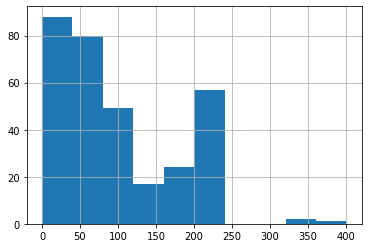

In [227]:
samsungdf['desclen'] = samsungdf['desc'].apply(len)
samsungdf['desclen'].hist()

### namelen

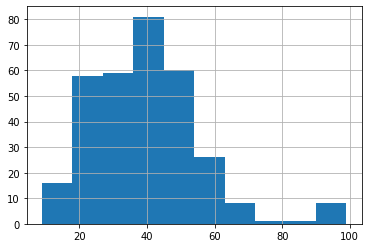

In [228]:
samsungdf['namelen'] = samsungdf['name'].apply(len)
samsungdf['namelen'].hist()

### titlelen

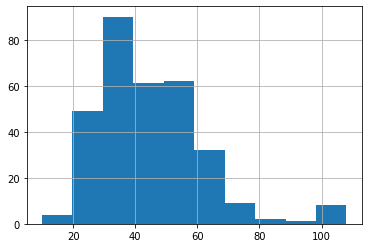

In [229]:
samsungdf['titlelen'] = samsungdf['title'].apply(len)
samsungdf['titlelen'].hist()

# Data visualization with sweetviz

In [232]:
samsungdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318 entries, 0 to 317
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Unnamed: 0   318 non-null    int64   
 1   title        318 non-null    object  
 2   name         318 non-null    object  
 3   brand        318 non-null    category
 4   category     318 non-null    object  
 5   price        318 non-null    float64 
 6   variantname  318 non-null    object  
 7   imageurl     318 non-null    object  
 8   desc         318 non-null    object  
 9   category0    318 non-null    category
 10  category1    304 non-null    category
 11  nodesc       318 non-null    bool    
 12  desclen      318 non-null    int64   
 13  namelen      318 non-null    int64   
 14  titlelen     318 non-null    int64   
dtypes: bool(1), category(3), float64(1), int64(4), object(6)
memory usage: 41.0+ KB


In [230]:
!pip install sweetviz
#!conda install sweetviz # for users with anaconda

     |████████████████████████████████| 15.1 MB 4.5 MB/s 


In [233]:
import sweetviz as sv

## split test and train set

In [234]:
def train_test_split(df, frac=0.2):
    # get random sample 
    test = df.sample(frac=frac, axis=0)
    # get everything but the test sample
    train = df.drop(index=test.index)
    return train, test

In [236]:
train, test = train_test_split(samsungdf.drop(columns=['title','name','category','variantname','imageurl','desc']))

## Generate report of the dataset

In [241]:
comparison_report = sv.compare([train,'Train'], [test,'Test'], target_feat='price')

                                             |          | [  0%]   00:00 -> (? left)

### Show the report


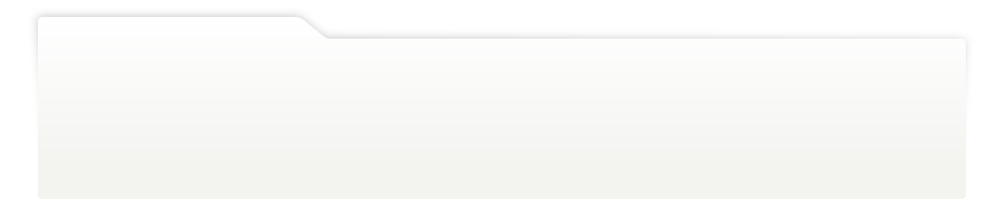
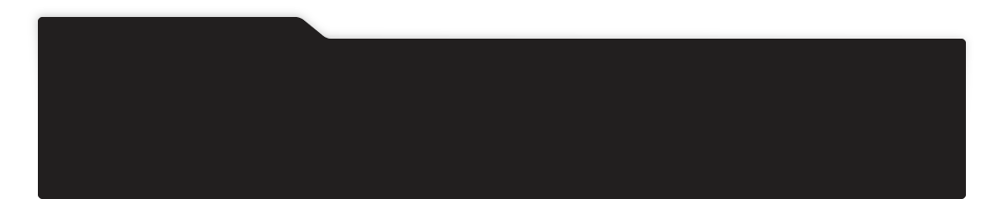
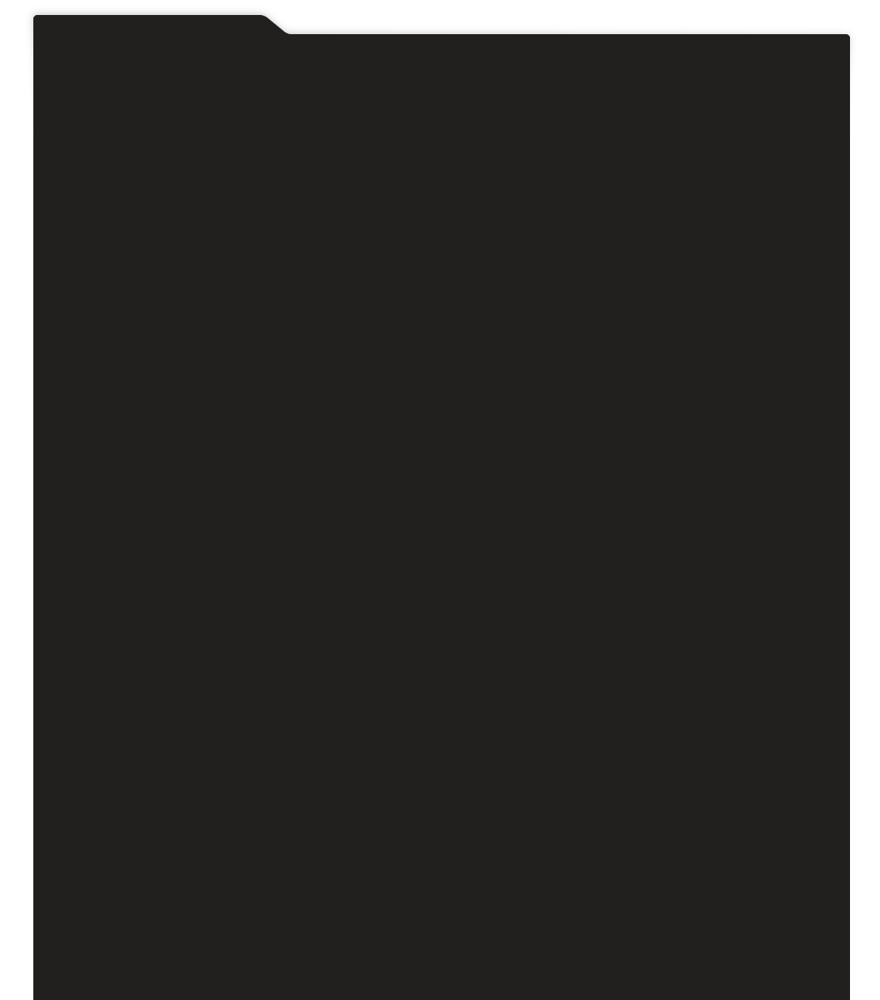
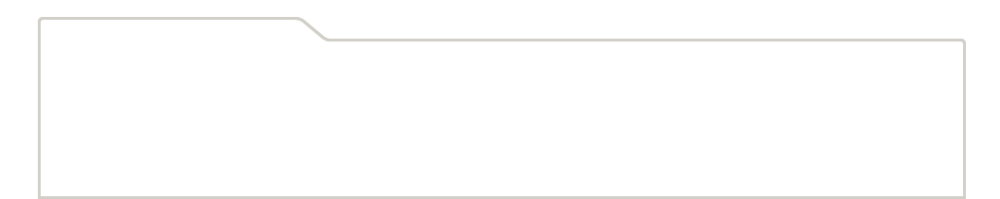
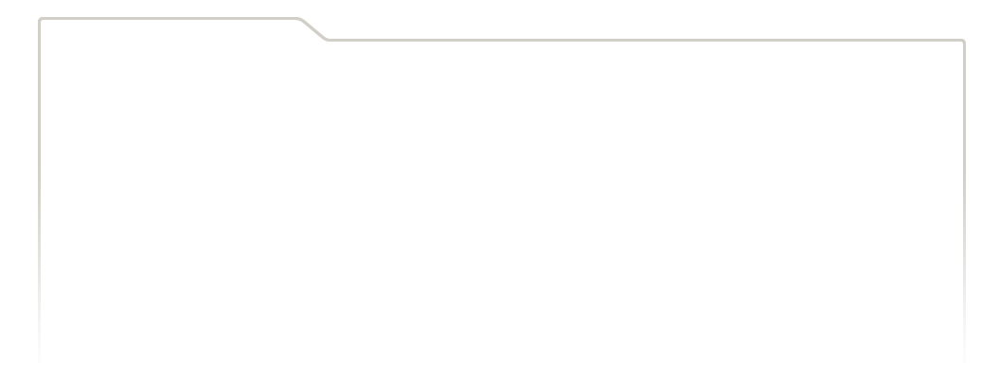
...
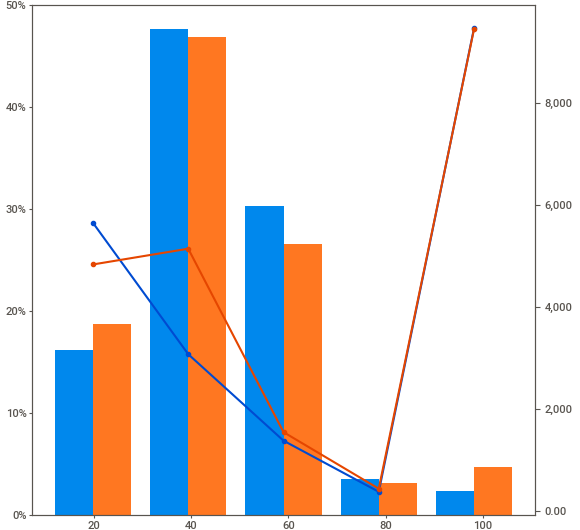
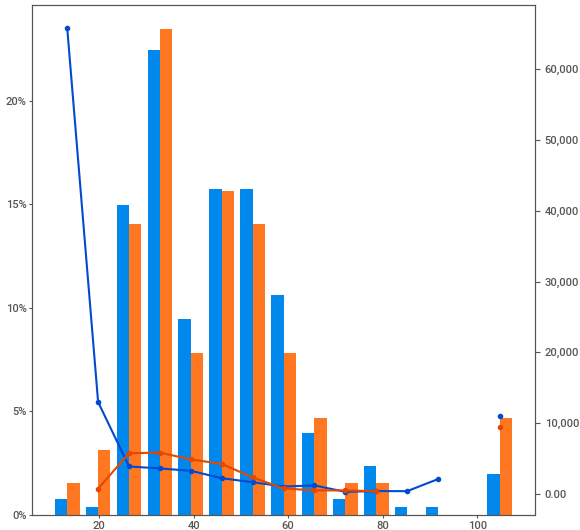
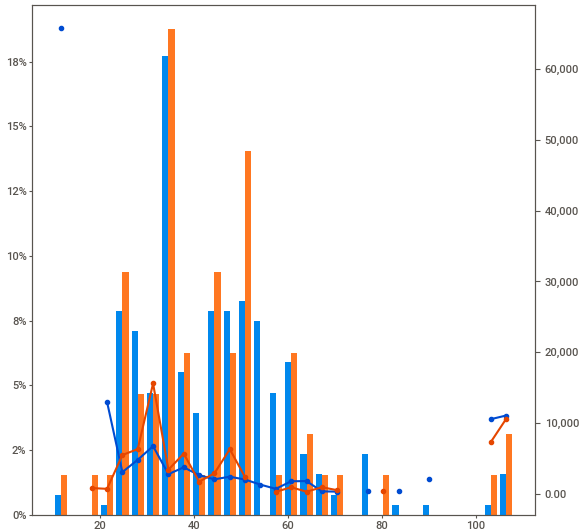
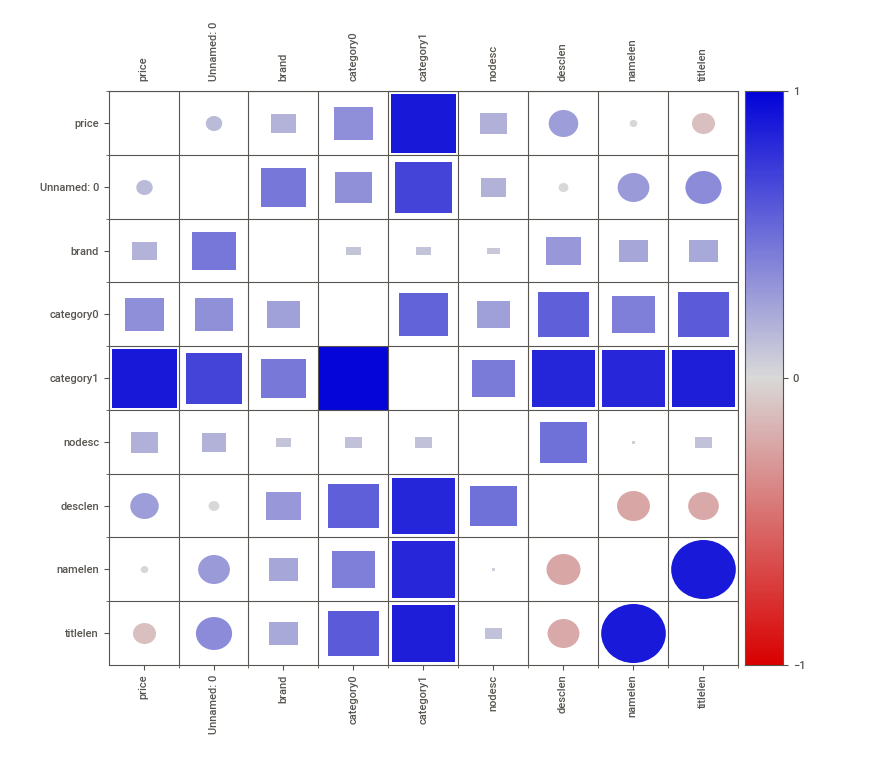
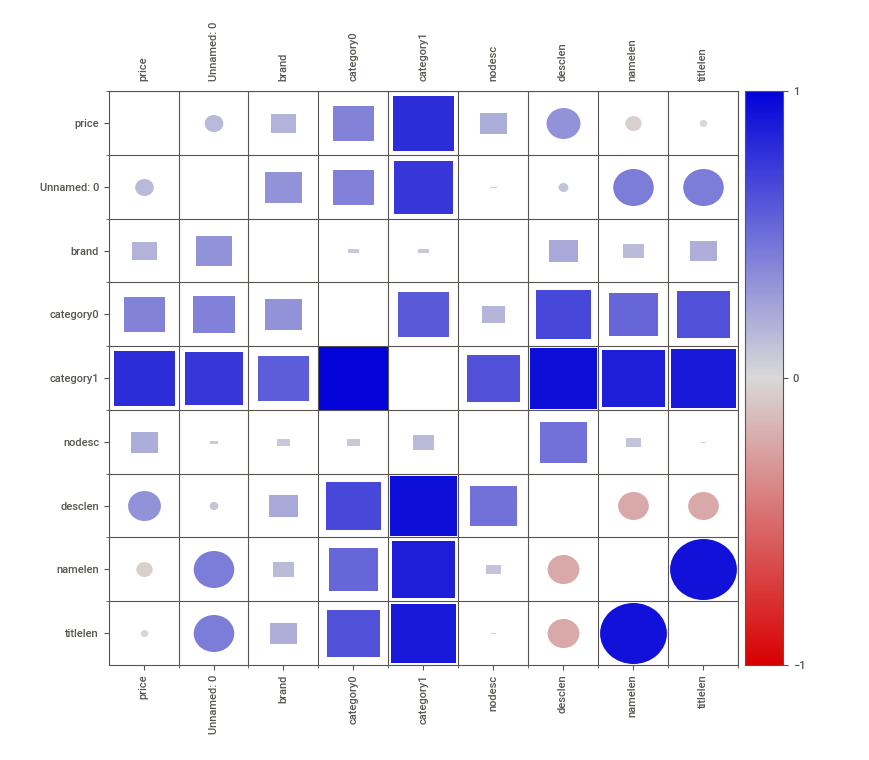

In [238]:
comparison_report.show_notebook()

## Other types of report

### analyze

In [242]:
feature_config = sv.FeatureConfig(skip="Unnamed: 0")
analyze_report = sv.analyze([samsungdf,'All'], 'price',  feature_config)

                                             |          | [  0%]   00:00 -> (? left)


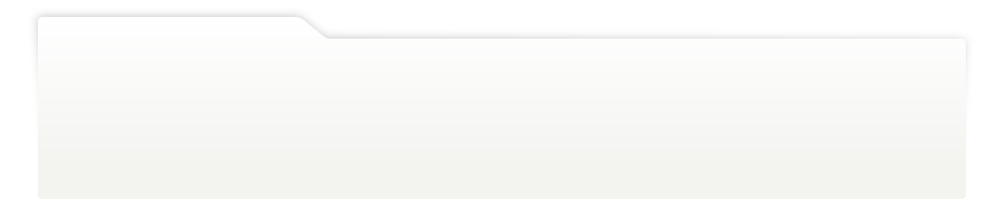
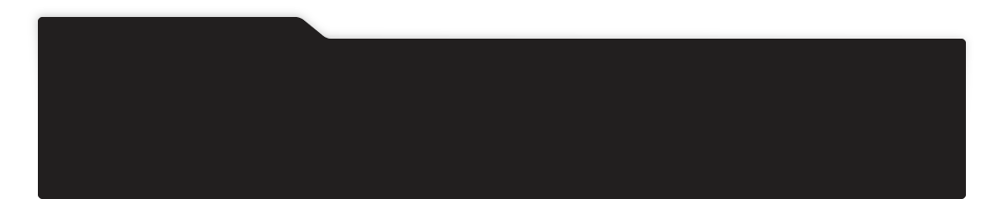
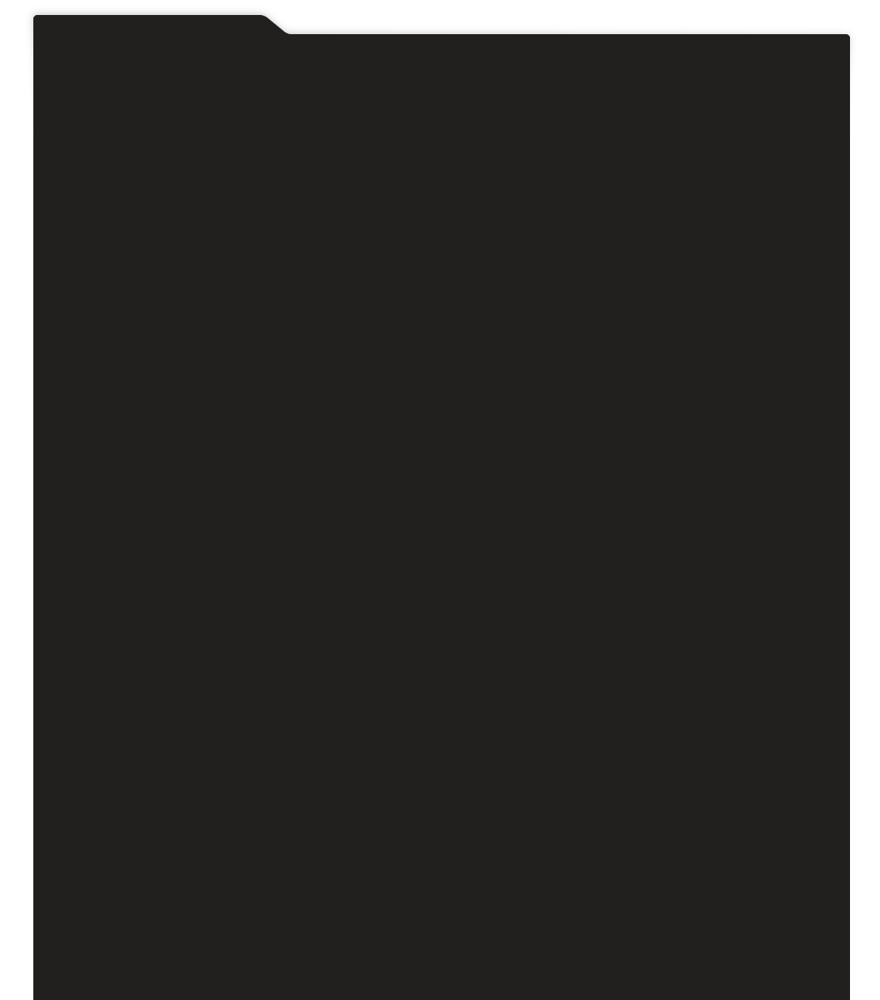
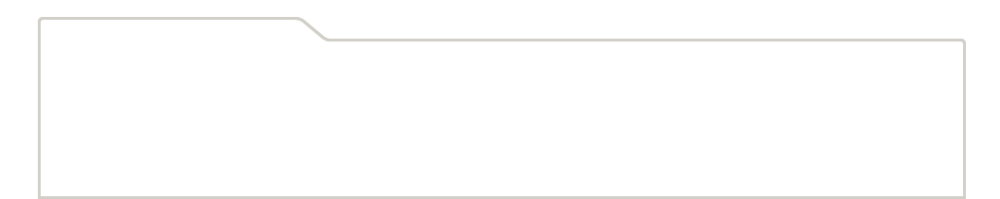
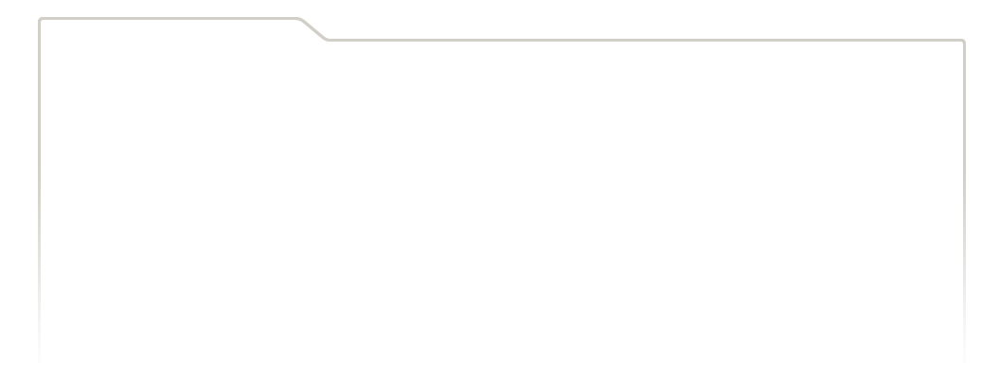
...
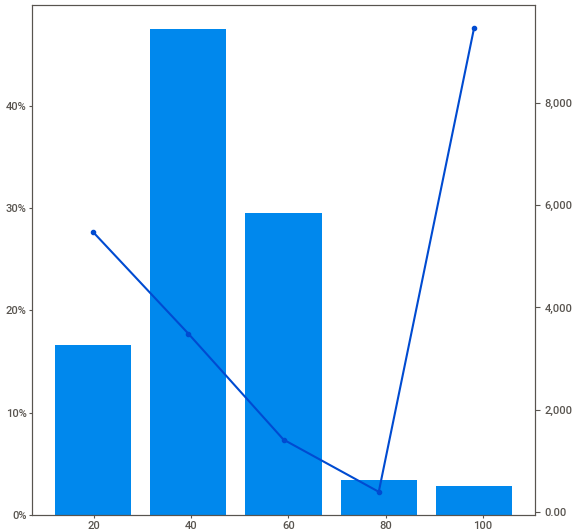
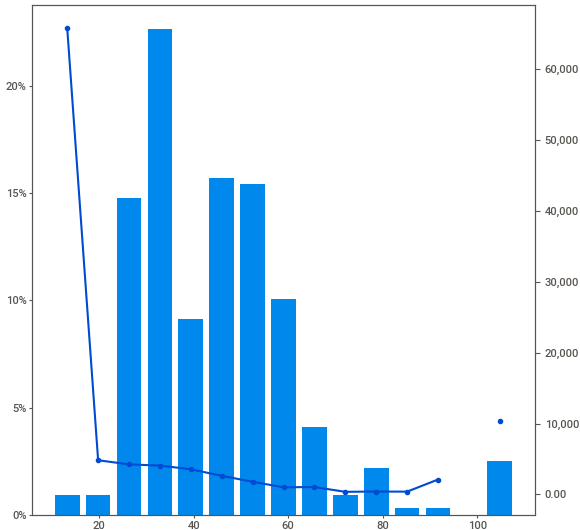
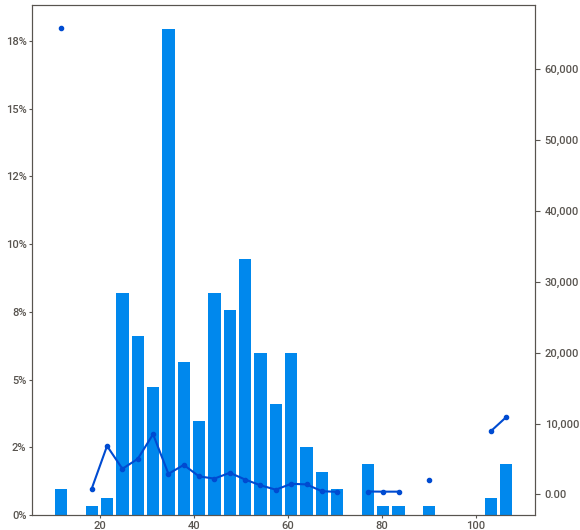
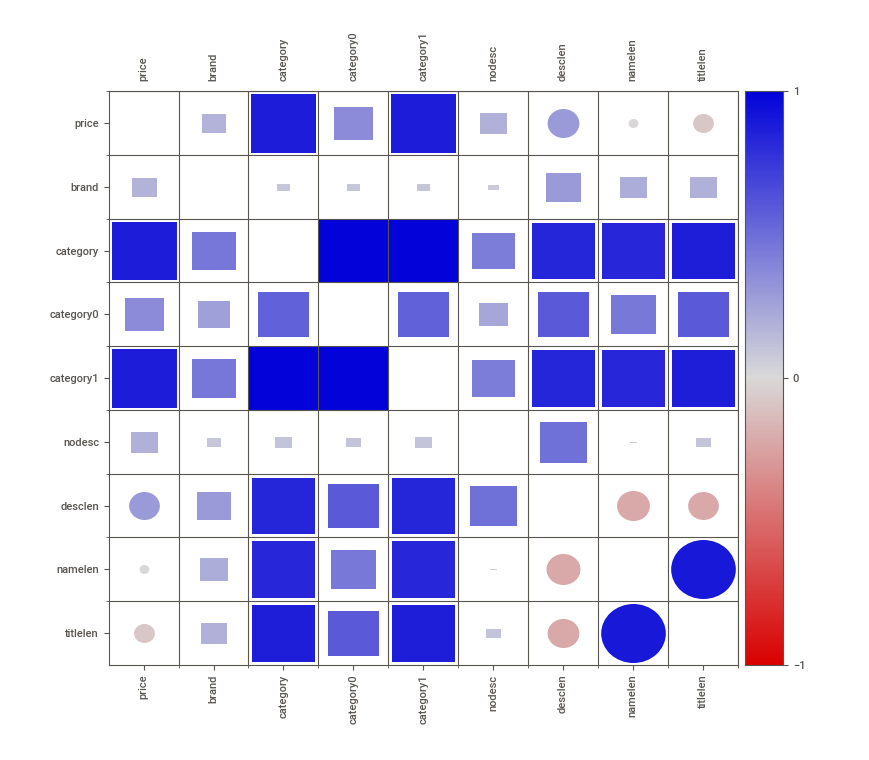
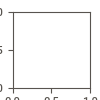

In [243]:
analyze_report.show_notebook()

### compare_intra

In [245]:
intra_report = sv.compare_intra(samsungdf, samsungdf["brand"] == 'samsung', ["Samsung", "Others"], 'price', feature_config)

                                             |          | [  0%]   00:00 -> (? left)


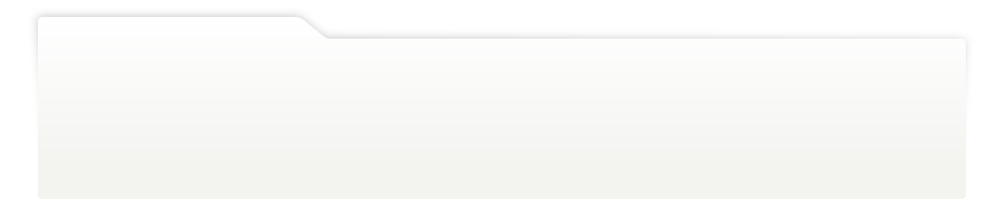
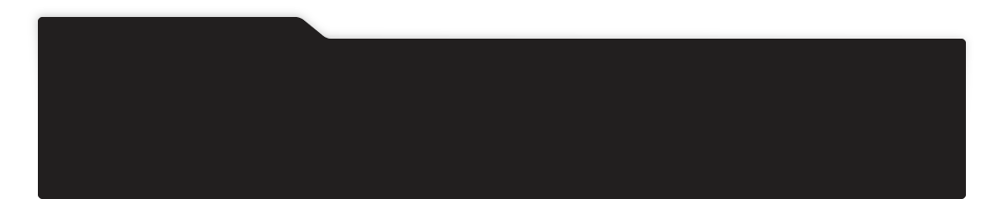
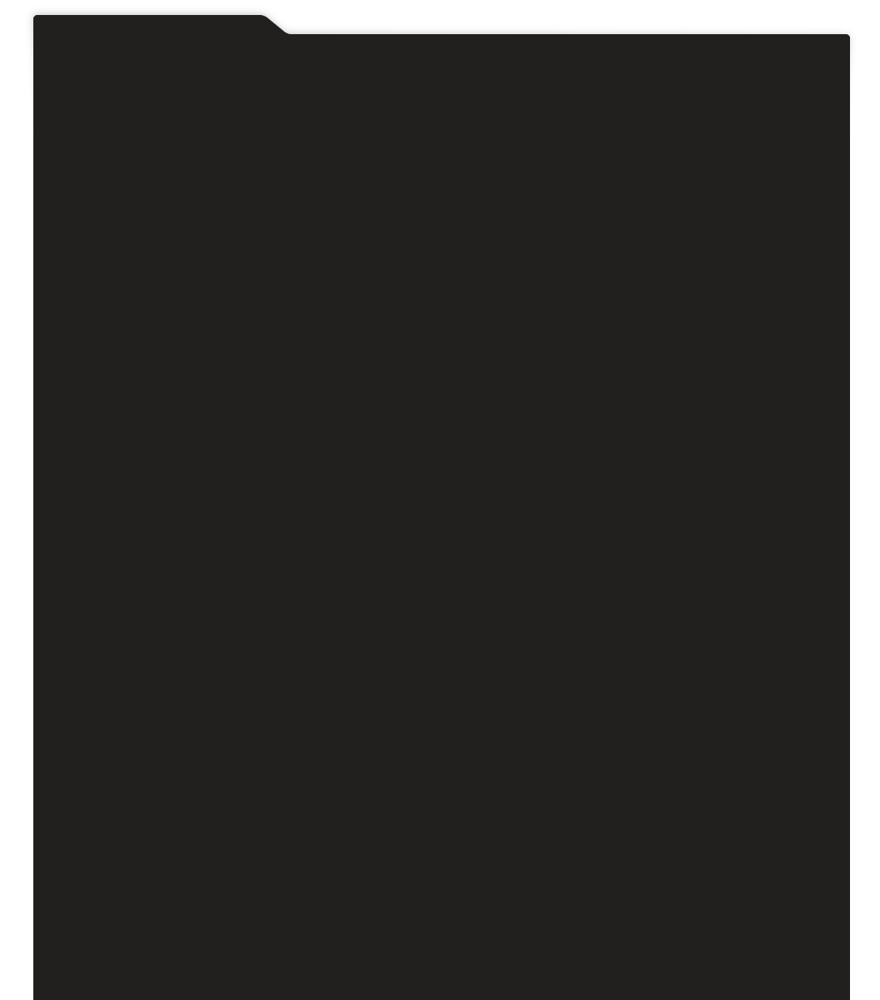
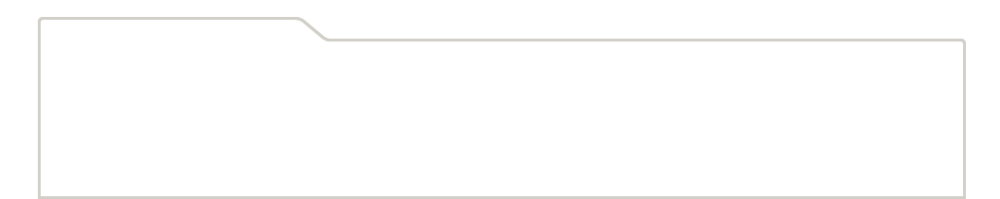
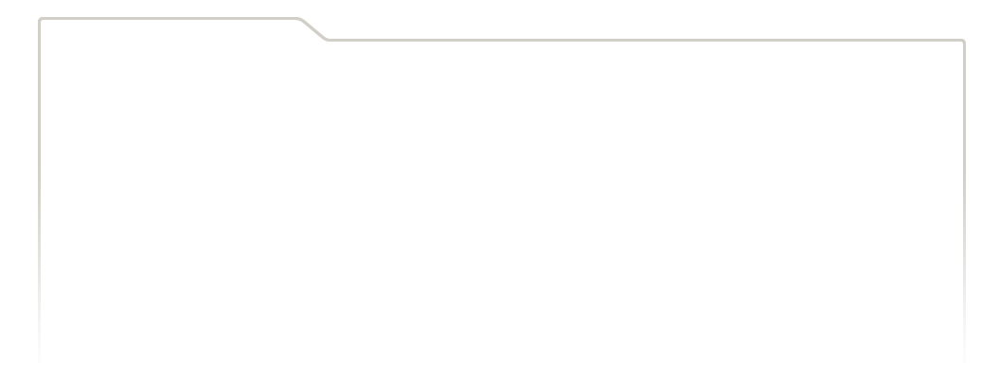
...
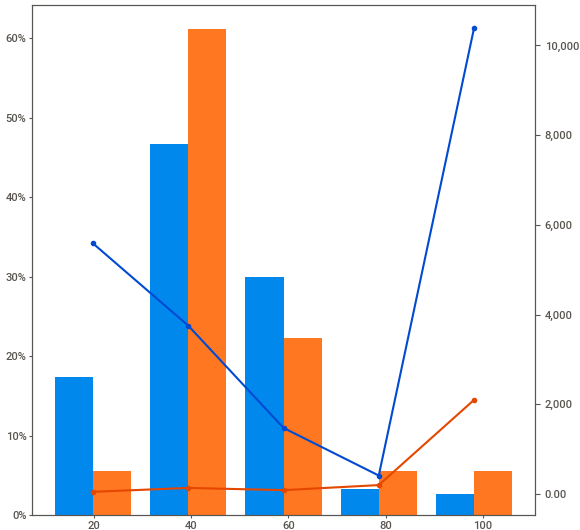
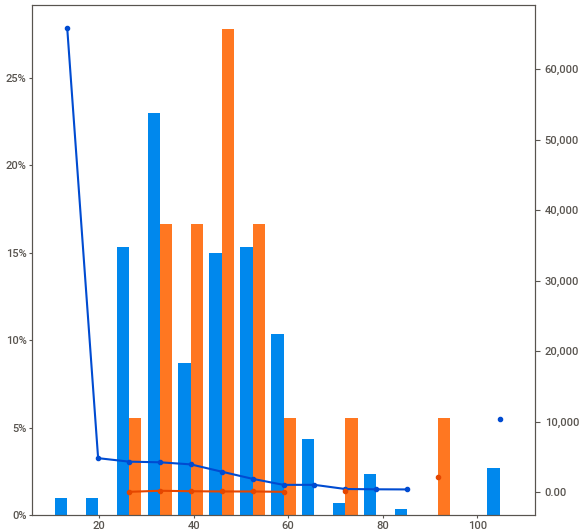
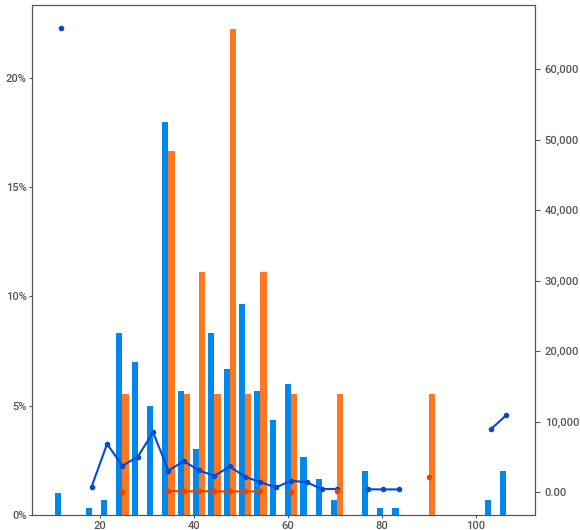
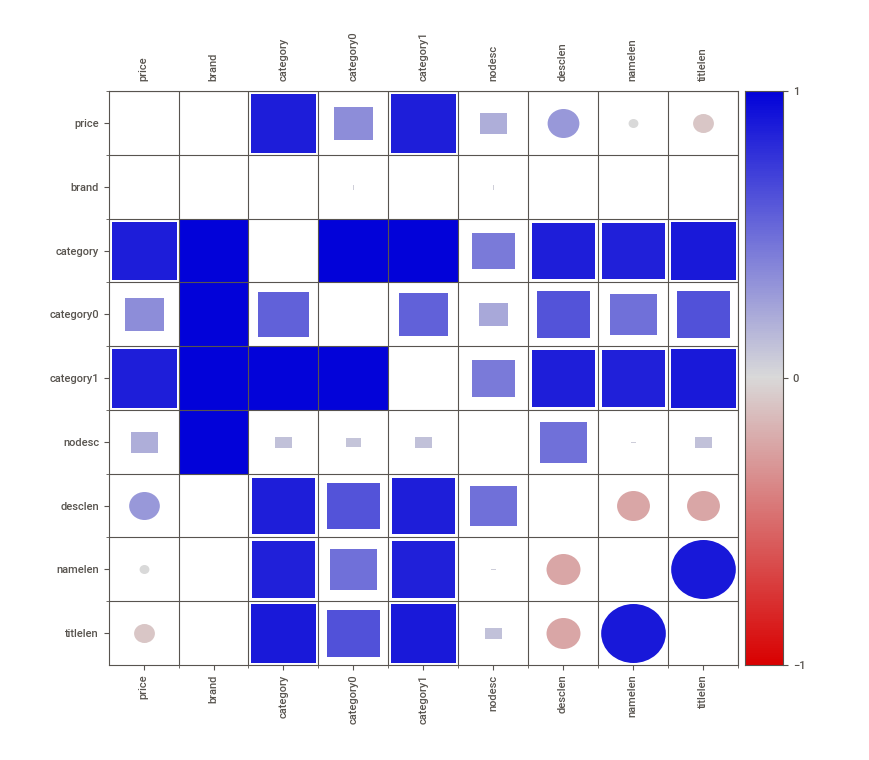
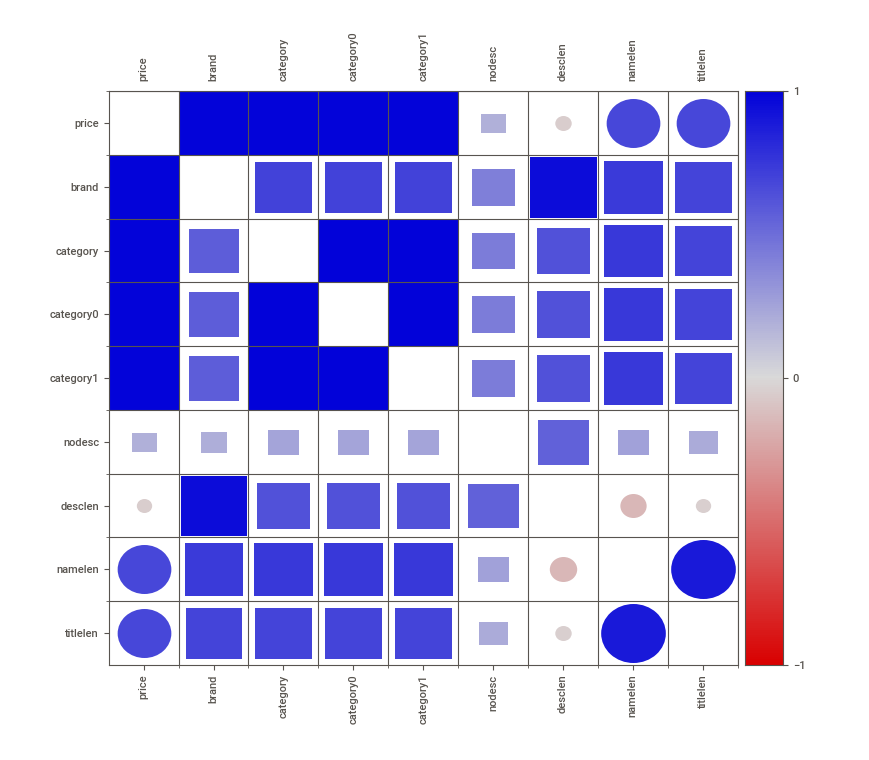

In [246]:
intra_report.show_notebook()